In [1]:
# House Price Prediction with Clustering and Filtering

# Import Required Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [5]:
# Data Loading
# Load the dataset. Replace the file path with your actual file path.
file_path = 'preprocessed.json'
df = pd.read_json(file_path)
df.head()

,ID,Title,Price,UpdatedAt,Type,Region,Author,AuthorProfile,Description,HousingType,TotalArea,Condition,NrRooms,Balcony,Floor,NumberOfFloors,Lon,Lat
0,82269463,"Apartament cu 2 camere, 80 m², Botanica, Chișinău",99900,2023-04-30T19:05:00Z,Tipul: Vând,"Moldova, Chișinău mun., Chișinău, Botanica,...","topestate-botanica 2,8",https://999.md/ro/profile/topestate-botanica,,Construcţii noi,80,Euroreparație,2,1,16,17,28.843789,46.986127
1,78509490,"Apartament cu 3 camere, 99 m², Centru, Chișinău",159900,2023-04-30T13:27:00Z,Tipul: Vând,"Moldova, Chișinău mun., Chișinău, Centru, ...",Connect6565,https://999.md/ro/profile/Connect6565,,Construcţii noi,99,Euroreparație,3,1,7,8,28.850124,47.020729
2,80854492,"O cameră, 17 m², Botanica, Chișinău",7900,2023-05-01T11:00:00Z,Tipul: Vând,"Moldova, Chișinău mun., Chișinău, Botanica,...",MAX-202,https://999.md/ro/profile/MAX-202,,Secundar,17,Reparație cosmetică,0,1,5,5,28.949794,46.936900
3,82058441,"Apartament cu 3 camere, 84 m², Durlești, Chișinău",65000,2023-05-01T11:15:00Z,Tipul: Vând,"Moldova, Chișinău mun., Chișinău, Durlești,...",acces219,https://999.md/ro/profile/acces219,,Construcţii noi,84,La alb,3,1,7,8,28.760488,47.011068
4,81788666,"Apartament cu 2 camere, 67 m², Ciocana, Chișinău",72999,2023-04-27T10:26:00Z,Tipul: Vând,"Moldova, Chișinău mun., Chișinău, Ciocana, ...",Lumeamd-Evelina,https://999.md/ro/profile/Lumeamd-Evelina,,Construcţii noi,67,Euroreparație,2,2,2,9,28.894026,47.037872


In [6]:
# Data Cleaning
# Convert 'UpdatedAt' to datetime format
df['UpdatedAt'] = pd.to_datetime(df['UpdatedAt'])

# Feature Engineering
# Extract month and year from 'UpdatedAt'
df['UpdateMonth'] = df['UpdatedAt'].dt.month
df['UpdateYear'] = df['UpdatedAt'].dt.year

In [7]:
# Apply Filtering Conditions
# Limit the price between 25000 and 200000 and remove properties with 0 rooms
filtered_df = df[(df['Price'] >= 25000) & (df['Price'] <= 200000) & (df['NrRooms'] > 0)]


In [8]:
# Standardize the features for clustering
clustering_features_geo = ['Lat', 'Lon']
scaler_geo = StandardScaler()
scaled_data_geo = scaler_geo.fit_transform(filtered_df[clustering_features_geo])


In [9]:
# Perform KMeans clustering based on 'Lat' and 'Lon'
kmeans_geo = KMeans(n_clusters=25, random_state=42)
filtered_df['GeoCluster'] = kmeans_geo.fit_predict(scaled_data_geo)

/home/stefan/PycharmProjects/sad/venv/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/tmp/ipykernel_57636/3294672009.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['GeoCluster'] = kmeans_geo.fit_predict(scaled_data_geo)


In [10]:
# Extended Exploratory Data Analysis (EDA)
# Summary statistics
print(filtered_df.describe())

               Price     TotalArea       NrRooms       Balcony         Floor  \
count   16394.000000  16394.000000  16394.000000  16394.000000  16394.000000   
mean    70172.082530     67.011346      2.117421      1.194217      5.227278   
std     31177.912393     56.419444      0.809304      0.595619      3.434365   
min     25000.000000      5.000000      1.000000      0.000000      0.000000   
25%     47900.000000     50.000000      2.000000      1.000000      3.000000   
50%     63700.000000     65.000000      2.000000      1.000000      5.000000   
75%     85000.000000     77.000000      3.000000      1.000000      7.000000   
max    200000.000000   6485.000000      5.000000      3.000000     21.000000   

       NumberOfFloors           Lon           Lat   UpdateMonth  UpdateYear  \
count    16394.000000  16394.000000  16394.000000  16394.000000     16394.0   
mean         9.304502     28.808497     47.043700      4.126876      2023.0   
std          3.727462      0.180240      0

In [11]:
# Correlation matrix
corr_matrix = filtered_df.corr(numeric_only=True)
print(corr_matrix)

                   Price  TotalArea   NrRooms   Balcony     Floor  \
Price           1.000000   0.303632  0.437071  0.086108  0.115421   
TotalArea       0.303632   1.000000  0.297225  0.081206  0.028110   
NrRooms         0.437071   0.297225  1.000000  0.224896 -0.034535   
Balcony         0.086108   0.081206  0.224896  1.000000  0.029772   
Floor           0.115421   0.028110 -0.034535  0.029772  1.000000   
NumberOfFloors  0.202278   0.040426 -0.094823  0.032875  0.551194   
Lon             0.121897   0.003214 -0.077171 -0.028311  0.077749   
Lat            -0.099278  -0.003417  0.060970  0.039119 -0.045657   
UpdateMonth     0.010382  -0.000844 -0.009994 -0.020980  0.015383   
UpdateYear           NaN        NaN       NaN       NaN       NaN   
GeoCluster      0.004647  -0.010024 -0.034660  0.011680  0.053045   

                NumberOfFloors       Lon       Lat  UpdateMonth  UpdateYear  \
Price                 0.202278  0.121897 -0.099278     0.010382         NaN   
TotalArea    

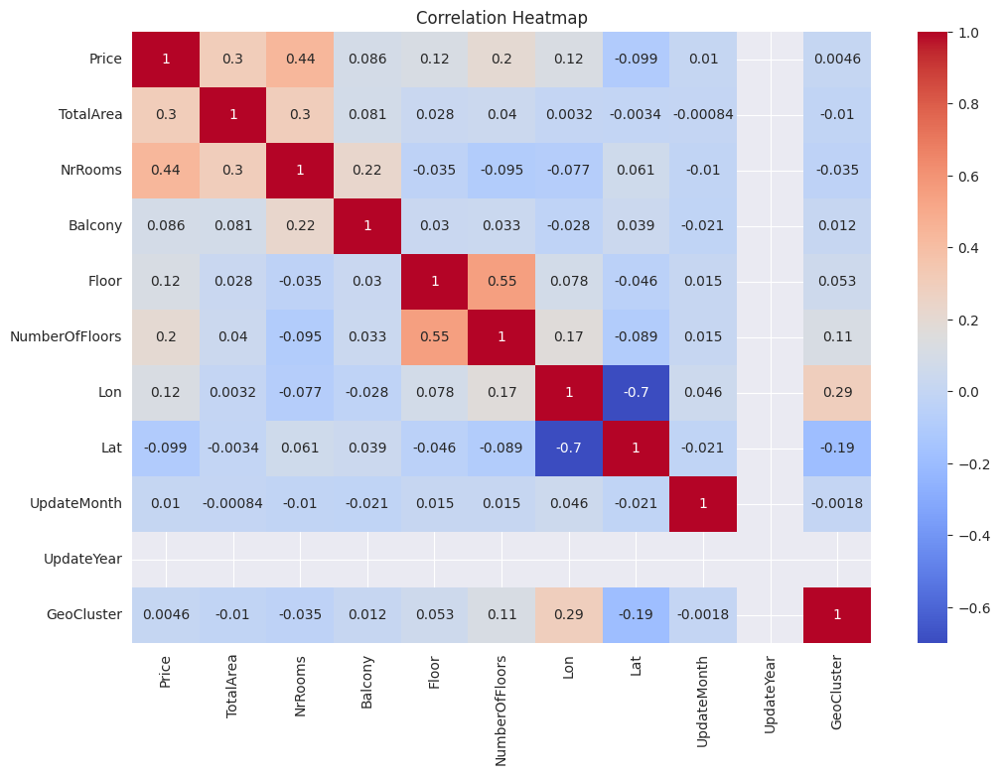

In [12]:
# Heatmap for correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


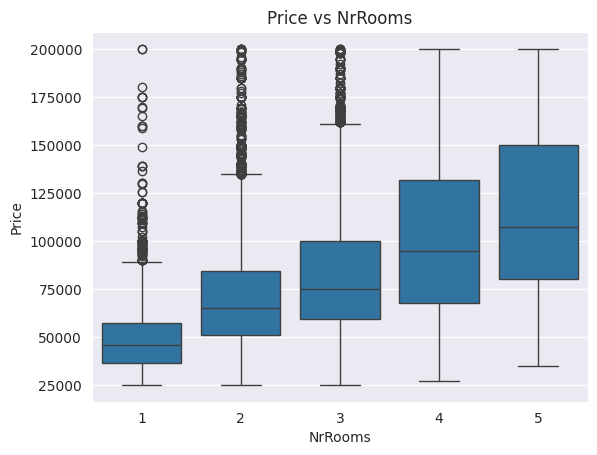

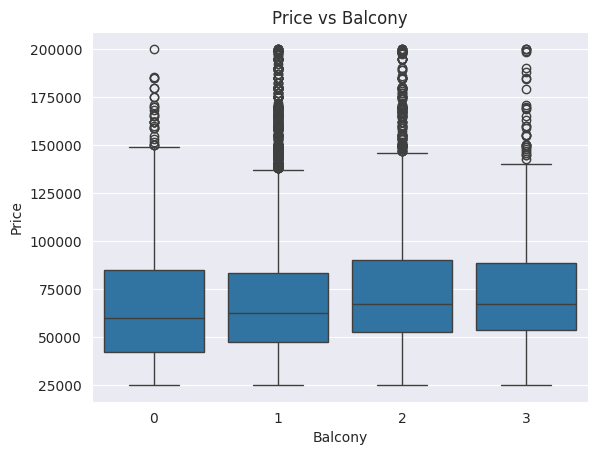

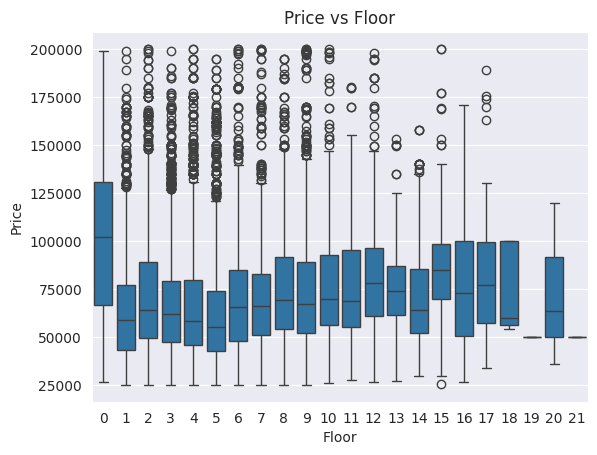

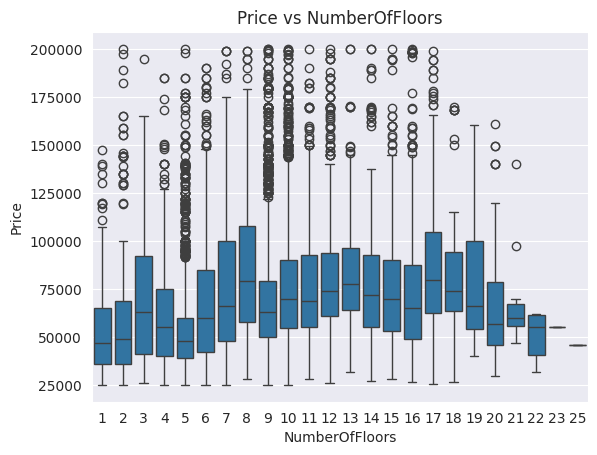

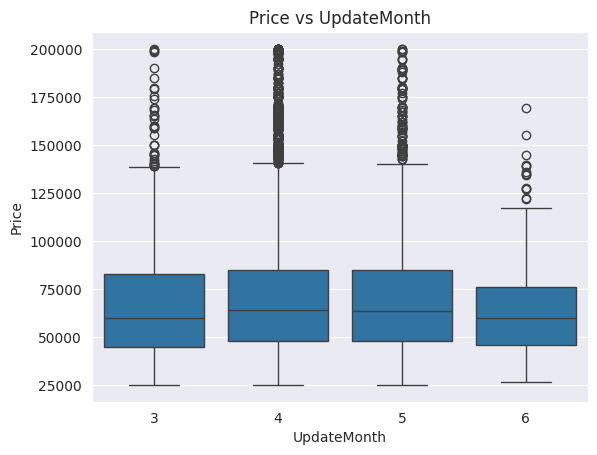

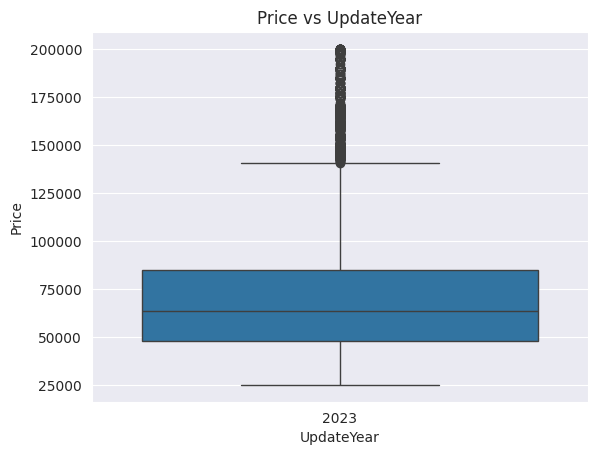

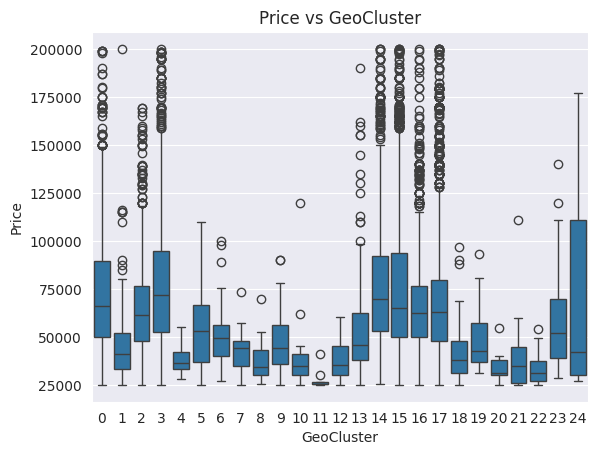

In [13]:
# Boxplots for categorical features
for feature in ['NrRooms', 'Balcony', 'Floor', 'NumberOfFloors', 'UpdateMonth', 'UpdateYear', 'GeoCluster']:
    sns.boxplot(x=feature, y='Price', data=filtered_df)
    plt.title(f'Price vs {feature}')
    plt.show()


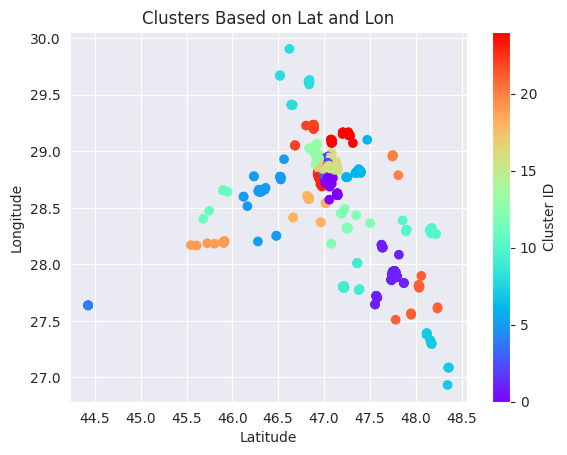

In [14]:



# Visualizing the Clusters on a Scatter Plot
plt.scatter(filtered_df['Lat'], filtered_df['Lon'], c=filtered_df['GeoCluster'], cmap='rainbow')
plt.title('Clusters Based on Lat and Lon')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.colorbar().set_label('Cluster ID')
plt.show()

In [15]:
import folium

# Create a colormap
cmap = plt.get_cmap('tab20', 20)

# Create a map object
m = folium.Map(location=[filtered_df['Lat'].mean(), filtered_df['Lon'].mean()], zoom_start=13)

# Add points to the map
for idx, row in filtered_df.iterrows():
    color = plt.cm.tab20(row['GeoCluster'] % 20)  # Cycle through 20 colors
    color = [int(x*255) for x in color[:3]]  # Convert to 0-255 RGB scale
    color = f'#{color[0]:02x}{color[1]:02x}{color[2]:02x}'  # Convert to hexadecimal

    folium.CircleMarker(location=[row['Lat'], row['Lon']], 
                        radius=5,
                        color=color,
                        fill=True,
                        fill_opacity=0.7).add_to(m)


# Show the map
m

In [20]:
features = ['TotalArea', 'NrRooms', 'Balcony', 'Floor', 'NumberOfFloors','Lat', 'Lon',  'UpdateMonth',  'GeoCluster','Price']

filtered_df[features].to_csv('sample.csv', index=False)

In [17]:
# Model Building
# Train a Random Forest model
target = 'Price'
X_train, X_test, y_train, y_test = train_test_split(filtered_df[features], filtered_df[target], test_size=0.2, random_state=42)
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [18]:
# Evaluation
# Evaluate the model
y_pred = rf_regressor.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
print(f'MSE: {mse}, RMSE: {rmse}, R2: {r2}')

MSE: 160339340.84536383, RMSE: 12662.517160713498, R2: 0.8325668149681342


In [19]:
# Hyperparameter Tuning
# Grid search for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [5, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_rf = RandomForestRegressor(**best_params, random_state=42)
best_rf.fit(X_train, y_train)
y_pred_best = best_rf.predict(X_test)
r2_best = r2_score(y_test, y_pred_best)
print(f'Best Params: {best_params}, Best R2: {r2_best}')

Fitting 3 folds for each of 32 candidates, totalling 96 fits


/home/stefan/PycharmProjects/sad/venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
48 fits failed out of a total of 96.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "/home/stefan/PycharmProjects/sad/venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/stefan/PycharmProjects/sad/venv/lib/python3.8/site-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/home/stefan/PycharmProjects/sad/venv/lib/python3.8/site-packages/sklearn/base.py", line 638, in _validate_pa

Best Params: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}, Best R2: 0.8381344361251615


TPOT is an automated machine learning library that optimizes machine learning pipelines using genetic programming. Here's a basic outline of steps you'll take to use TPOT

In [22]:
from tpot import TPOTRegressor
from sklearn.model_selection import train_test_split
import pandas as pd

# Load the dataset
# Assuming the file 'sample.csv' is in the current working directory and formatted correctly
df = pd.read_csv('sample.csv')

# Assuming the last column is the target variable
X = df.drop(columns=['Price'])
y = df['Price']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, test_size=0.25)

# Create the TPOT regressor
tpot = TPOTRegressor(generations=5, population_size=50, verbosity=2, random_state=42)

# Run the TPOT optimization
tpot.fit(X_train, y_train)

# Print the final model
print(tpot.fitted_pipeline_)

# Evaluate the model on the testing set
print(tpot.score(X_test, y_test))

# Export the pipeline to a Python script file
tpot.export('tpot_exported_pipeline.py')


Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -219662729.69617224

Generation 2 - Current best internal CV score: -210656927.1116601

Generation 3 - Current best internal CV score: -194824952.29742903

Generation 4 - Current best internal CV score: -194824952.29742903

Generation 5 - Current best internal CV score: -194824952.29742903

Best pipeline: XGBRegressor(input_matrix, learning_rate=0.1, max_depth=9, min_child_weight=7, n_estimators=100, n_jobs=1, objective=reg:squarederror, subsample=0.9000000000000001, verbosity=0)
Pipeline(steps=[('xgbregressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
  